In [1]:
!pip install pytorch-lightning
#!curl https://raw.githubusercontent.com/pytorch/xla/master/contrib/scripts/env-setup.py -o pytorch-xla-env-setup.py
#!python pytorch-xla-env-setup.py --version nightly --apt-packages libomp5 libopenblas-dev
!pip install segmentation_models_pytorch

     |████████████████████████████████| 687 kB 867 kB/s 
     |████████████████████████████████| 98 kB 3.0 MB/s 
  Attempting uninstall: fsspec
    Found existing installation: fsspec 0.7.2
    Uninstalling fsspec-0.7.2:
      Successfully uninstalled fsspec-0.7.2
You should consider upgrading via the '/opt/conda/bin/python3.7 -m pip install --upgrade pip' command.
     |████████████████████████████████| 66 kB 600 kB/s 
     |████████████████████████████████| 244 kB 2.5 MB/s 
     |████████████████████████████████| 58 kB 2.1 MB/s 
  Created wheel for efficientnet-pytorch: filename=efficientnet_pytorch-0.6.3-py3-none-any.whl size=12419 sha256=37ff66aec72e09906db24c146cda1b2ad88908c9bed9efd1661610ca526754a0
  Stored in directory: /root/.cache/pip/wheels/90/6b/0c/f0ad36d00310e65390b0d4c9218ae6250ac579c92540c9097a
  Created wheel for pretrainedmodels: filename=pretrainedmodels-0.7.4-py3-none-any.whl size=60962 sha256=5c468785b31ff865260b0f38ab1cdd26e7507e097ad129e14e477d4949fffc93
  Stored

In [2]:
import numpy as np
import pandas as pd
import os
import ast
import time
from tqdm.notebook import tqdm

import matplotlib.pyplot as plt

from PIL import Image
from skimage import io as skimage_io
from skimage import transform as skimage_transform

import torch
torch.backends.cudnn.deterministic = True
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision
import segmentation_models_pytorch as smp

import pytorch_lightning as pl
from pytorch_lightning import loggers as pl_loggers
from pytorch_lightning.metrics.classification import Accuracy, ConfusionMatrix, F1, ROC, FBeta, Precision, Recall
from pytorch_lightning.metrics import functional as FM

if(torch.cuda.is_available() == True):
    device = torch.device("cuda:0")
    print("Using GPU")
else:
    device = torch.device("cpu")
    print("Not using GPU")

Using GPU


In [3]:
BASE_PATH = '/kaggle/input/airbus-ship-detection/'
SEG_CSV_PATH = os.path.join(BASE_PATH, 'train_ship_segmentations_v2.csv')
TRAIN_IMGS_PATH = os.path.join(BASE_PATH, 'train_v2/')
TEST_IMGS_PATH = os.path.join(BASE_PATH, 'test_v2/')
SAMPLE_SUB_CSV_PATH = os.path.join(BASE_PATH, 'sample_submission_v2.csv')

ORIG_DIM = 768

In [4]:
train_seg_csv = pd.read_csv('/kaggle/input/external-data/train_seg.csv').sample(frac = 0.5).reset_index(drop = True)
train_seg_csv['Target'] = train_seg_csv['Target'].astype(np.uint8)
train_seg_csv['EncodedPixels'] = train_seg_csv['EncodedPixels'].fillna('')
train_seg_csv = train_seg_csv[train_seg_csv['ImageId'] != '6384c3e78.jpg']
sample_size = train_seg_csv['Target'].value_counts().loc[1]
train_seg_csv = train_seg_csv.groupby('Target').apply(lambda x: x.sample(sample_size)).sample(frac = 1).reset_index(drop = True)
print(train_seg_csv.shape)
train_seg_csv.head()

(42624, 3)


,ImageId,EncodedPixels,Target
0,367e8565a.jpg,,0
1,44106f767.jpg,530057 16 530825 16 531593 16 532361 16 533129...,1
2,ccd3caec3.jpg,200263 1 201029 4 201795 6 202561 9 203328 10 ...,1
3,dae7a2602.jpg,,0
4,5ef3e14ad.jpg,,0


In [5]:
def load_img(path):
    return skimage_io.imread(path)

def convert_to_numpy(img):
    return np.asarray(img, dtype = np.uint8)

def convert_rle_to_seg(rle_code):
    if(rle_code == ''):
        return []
    rle_seg = [int(x) for x in rle_code.split(' ')]
    rle_seg = list(zip(rle_seg[:-1:2], rle_seg[1::2]))
    seg = [(pixel_position % ORIG_DIM, pixel_position // ORIG_DIM) for start, length in rle_seg for pixel_position in range(start, start + length)]
    return seg

def convert_seg_to_mask(seg):
    mask = np.zeros((ORIG_DIM, ORIG_DIM, 1), dtype = np.float32)
    for x, y in seg:
        if(x >= ORIG_DIM):
            x = ORIG_DIM - 1
        if(y >= ORIG_DIM):
            y = ORIG_DIM - 1
        mask[x, y, 0] = 1
    return mask

In [6]:
TRAIN_PERC = 70
VAL_PERC = 10
BATCH_SIZE = 32
EPOCHS = 10
NUM_WORKERS = 4
ACC_GRAD_BATCHES = 1
PRECISION = 32

In [7]:
total_train_size = train_seg_csv.shape[0]
train_size = total_train_size * TRAIN_PERC // 100
val_size = total_train_size * VAL_PERC // 100
test_size = total_train_size - train_size - val_size

all_idx = np.arange(total_train_size)
np.random.shuffle(all_idx)
train_idx = all_idx[:train_size]
val_idx = all_idx[train_size: train_size + val_size]
test_idx = all_idx[train_size + val_size: ]

In [8]:
ORIG_RESOLUTION = 3
NEW_DIM = 224
NEW_RESOLUTION = ORIG_RESOLUTION * ORIG_DIM / NEW_DIM
print(f"New Resolution: {NEW_RESOLUTION:.2f}m")

New Resolution: 10.29m


In [9]:
target_cols = 'EncodedPixels'

class SatelliteDataset(Dataset):
    def __init__(self, data_csv, idx, root_dir, transforms):
        self.data_csv = data_csv.iloc[idx]
        self.root_dir = root_dir
        self.transforms = transforms

    def __len__(self):
        return len(self.data_csv)

    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()
        img_name = os.path.join(self.root_dir, self.data_csv.iloc[idx, 0])
        image = convert_to_numpy(load_img(img_name))
        targets = convert_seg_to_mask(convert_rle_to_seg(self.data_csv.iloc[idx][target_cols]))
        sample = {'image': image, 'targets': targets}
        sample = self.transforms(sample)
        return sample

class Rescale(object):
    def __init__(self, output_size):
        assert isinstance(output_size, (int, tuple))
        self.output_size = output_size

    def __call__(self, sample):
        image, targets = sample['image'], sample['targets']
        
        h, w = image.shape[:2]
        if isinstance(self.output_size, int):
            if h > w:
                new_h, new_w = self.output_size * h / w, self.output_size
            else:
                new_h, new_w = self.output_size, self.output_size * w / h
        else:
            new_h, new_w = self.output_size

        new_h, new_w = int(new_h), int(new_w)
        image = skimage_transform.resize(image, (new_h, new_w), preserve_range = True)
        targets = skimage_transform.resize(targets, (new_h, new_w), preserve_range = True).round().astype(np.uint8)

        return {'image': image, 'targets': targets}

class Normalize(object):
    def __init__(self, means, stds):
        self.means = means
        self.stds = stds
    
    def __call__(self, sample):
        image, targets = sample['image'], sample['targets']
        
        image = (image - 0) / (255 - 0)
        image = np.divide(np.subtract(image, self.means), self.stds)
        
        return {'image': image, 'targets': targets}

class ToTensor(object):
    def __call__(self, sample):
        image, targets = sample['image'], sample['targets']

        image = image.transpose((2, 0, 1))
        targets = targets.transpose((2, 0, 1))
        return {'image': torch.from_numpy(image).float(),
                'targets': torch.from_numpy(targets).float()}

img_transforms = torchvision.transforms.Compose([
    Rescale((NEW_DIM, NEW_DIM)),
    Normalize(means = [0.485, 0.456, 0.406], stds = [0.229, 0.224, 0.225]),
    ToTensor()
])

train_dataset = SatelliteDataset(train_seg_csv, train_idx, TRAIN_IMGS_PATH, img_transforms)
val_dataset = SatelliteDataset(train_seg_csv, val_idx, TRAIN_IMGS_PATH, img_transforms)
test_dataset = SatelliteDataset(train_seg_csv, test_idx, TRAIN_IMGS_PATH, img_transforms)

train_dataloader = DataLoader(train_dataset, batch_size = BATCH_SIZE, shuffle = True, num_workers = NUM_WORKERS)
val_dataloader = DataLoader(val_dataset, batch_size = BATCH_SIZE, shuffle = False, num_workers = NUM_WORKERS)
test_dataloader = DataLoader(test_dataset, batch_size = 8, shuffle = False, num_workers = 1)

In [10]:
class DiceBCELoss(nn.Module):
    def __init__(self, weight=None, size_average=True):
        super(DiceBCELoss, self).__init__()

    def forward(self, inputs, targets, smooth=1):
        
        #comment out if your model contains a sigmoid or equivalent activation layer
        inputs = torch.sigmoid(inputs)       
        
        #flatten label and prediction tensors
        inputs = inputs.view(-1)
        targets = targets.view(-1)
        
        intersection = (inputs * targets).sum()                            
        dice_loss = 1 - (2.*intersection + smooth)/(inputs.sum() + targets.sum() + smooth)  
        BCE = F.binary_cross_entropy(inputs, targets, reduction='mean')
        Dice_BCE = BCE + dice_loss
        
        return Dice_BCE

ALPHA = 10
GAMMA = 2
class FocalLoss(nn.Module):
    def __init__(self, weight=None, size_average=True):
        super(FocalLoss, self).__init__()

    def forward(self, inputs, targets, alpha=ALPHA, gamma=GAMMA, smooth=1):
        
        #comment out if your model contains a sigmoid or equivalent activation layer
        inputs = torch.sigmoid(inputs)       
        
        #flatten label and prediction tensors
        inputs = inputs.view(-1)
        targets = targets.view(-1)
        
        #first compute binary cross-entropy 
        BCE = F.binary_cross_entropy(inputs, targets, reduction='mean')
        BCE_EXP = torch.exp(-BCE)
        focal_loss = alpha * (1-BCE_EXP)**gamma * BCE
                       
        return focal_loss

class IoUBCELoss(nn.Module):
    def __init__(self, weight=None, size_average=True):
        super(IoUBCELoss, self).__init__()

    def forward(self, inputs, targets, smooth=1):
        
        #comment out if your model contains a sigmoid or equivalent activation layer
        inputs = torch.sigmoid(inputs)       
        
        #flatten label and prediction tensors
        inputs = inputs.view(-1)
        targets = targets.view(-1)
        
        #intersection is equivalent to True Positive count
        #union is the mutually inclusive area of all labels & predictions 
        intersection = (inputs * targets).sum()
        total = (inputs + targets).sum()
        union = total - intersection 
        
        IoU = 1 - (intersection + smooth)/(union + smooth)
        BCE = F.binary_cross_entropy(inputs, targets, reduction='mean')
        IoU_BCE = BCE + IoU
                
        return IoU_BCE

#dice_loss = DiceBCELoss()
#focal_loss = FocalLoss()
iou_loss = IoUBCELoss()

In [11]:
class ResNet_Model(pl.LightningModule):
    def __init__(self):
        super().__init__()
        pretrained_model = smp.DeepLabV3Plus(encoder_name='resnet152', encoder_depth=5, encoder_weights='imagenet')
        self.model = pretrained_model
        self.sigmoid = nn.Sigmoid()
        
        self.train_acc = pl.metrics.Accuracy()
        self.train_f1 = pl.metrics.F1()
        self.train_f2 = pl.metrics.FBeta(num_classes = 2, beta = 2)
        self.val_acc = pl.metrics.Accuracy()
        self.val_f1 = pl.metrics.F1()
        self.val_f2 = pl.metrics.FBeta(num_classes = 2, beta = 2)

    def forward(self, x):
        return self.model(x)

    def training_step(self, batch, batch_idx):
        x, y = batch['image'], batch['targets']
        outputs = self.model(x)
        
        loss = iou_loss(outputs, y)
        #loss = focal_loss(outputs, y)
        #loss = dice_loss(outputs, y)
        #loss = F.binary_cross_entropy_with_logits(outputs, y)
        
        acc = self.train_acc(outputs, y)
        f1 = self.train_f1(outputs, y)
        f2 = self.train_f2(outputs, y)
        self.log('train_acc', acc, prog_bar = True)
        self.log('train_f1', f1, prog_bar = True)
        self.log('train_f2', f2, prog_bar = True)
        
        return loss
    
    def validation_step(self, batch, batch_idx):
        x, y = batch['image'], batch['targets']
        outputs = self.sigmoid(self.model(x))
        acc = self.val_acc(outputs, y)
        f1 = self.val_f1(outputs, y)
        f2 = self.val_f2(outputs, y)
        self.log('val_acc', acc, prog_bar = True)
        self.log('val_f1', f1, prog_bar = True)
        self.log('val_f2', f2, prog_bar = True)

    def configure_optimizers(self):
        optimizer = optim.Adam(self.parameters())
        return optimizer

In [12]:
model = ResNet_Model()
tb_logger = pl_loggers.TensorBoardLogger('logs/')

Downloading: "https://download.pytorch.org/models/resnet152-b121ed2d.pth" to /root/.cache/torch/checkpoints/resnet152-b121ed2d.pth


In [13]:
#model.load_state_dict(torch.load('/kaggle/input/external-data/trained_model_deeplabv3.pth'))
#model.eval()

In [14]:
start_time = time.time()

trainer = pl.Trainer(gpus = [0], precision = PRECISION, max_epochs = EPOCHS, accumulate_grad_batches = ACC_GRAD_BATCHES, logger = tb_logger)
trainer.fit(model, train_dataloader = train_dataloader, val_dataloaders = val_dataloader)

stop_time = time.time()
print(f"Time Taken: {(stop_time - start_time):.2f}s")
torch.save(model.state_dict(), './trained_model.pth')


Time Taken: 20716.19s


In [15]:
"""
from tqdm.notebook import tqdm as tqdm_notebook

model.freeze()

roc_metric = ROC()

for batch in tqdm_notebook(test_dataloader):
    X, y = batch['image'], batch['targets']
    outputs = nn.Sigmoid()(model(X))
    roc_metric.update(outputs, y)

fpr, tpr, threshs = roc_metric.compute()
fpr = fpr.numpy()
tpr = tpr.numpy()
threshs = threshs.numpy()
thresh_idx = np.argmax(tpr - fpr)
opt_thresh = threshs[thresh_idx]
print(f"Optimal Threshold: {opt_thresh:.2f}")

plt.plot(tpr, label = 'TPR')
plt.plot(fpr, label = 'FPR')
plt.legend(loc = 'best')
plt.show()
"""

'\nfrom tqdm.notebook import tqdm as tqdm_notebook\n\nmodel.freeze()\n\nroc_metric = ROC()\n\nfor batch in tqdm_notebook(test_dataloader):\n    X, y = batch[\'image\'], batch[\'targets\']\n    outputs = nn.Sigmoid()(model(X))\n    roc_metric.update(outputs, y)\n\nfpr, tpr, threshs = roc_metric.compute()\nfpr = fpr.numpy()\ntpr = tpr.numpy()\nthreshs = threshs.numpy()\nthresh_idx = np.argmax(tpr - fpr)\nopt_thresh = threshs[thresh_idx]\nprint(f"Optimal Threshold: {opt_thresh:.2f}")\n\nplt.plot(tpr, label = \'TPR\')\nplt.plot(fpr, label = \'FPR\')\nplt.legend(loc = \'best\')\nplt.show()\n'

In [16]:
from tqdm.notebook import tqdm as tqdm_notebook

model.freeze()

acc_metric = Accuracy()
f1_metric = F1()
f2_metric = FBeta(num_classes = 2, beta = 2)
prec_metric = Precision()
rec_metric = Recall()

for batch in tqdm_notebook(test_dataloader):
    X, y = batch['image'], batch['targets']
    outputs = nn.Sigmoid()(model(X))
    acc_metric.update(outputs, y)
    f1_metric.update(outputs, y)
    f2_metric.update(outputs, y)
    prec_metric.update(outputs, y)
    rec_metric.update(outputs, y)

In [17]:
print(f'Accuracy: {acc_metric.compute().numpy() * 100:.2f}%')
print(f'F1: {f1_metric.compute().numpy() * 100:.2f}%')
print(f'F2: {f2_metric.compute().numpy() * 100:.2f}%')
print(f'Precision: {prec_metric.compute().numpy() * 100:.2f}%')
print(f'Recall: {rec_metric.compute().numpy() * 100:.2f}%')

Accuracy: 99.89%
F1: 78.90%
F2: 79.22%
Precision: 78.38%
Recall: 79.43%


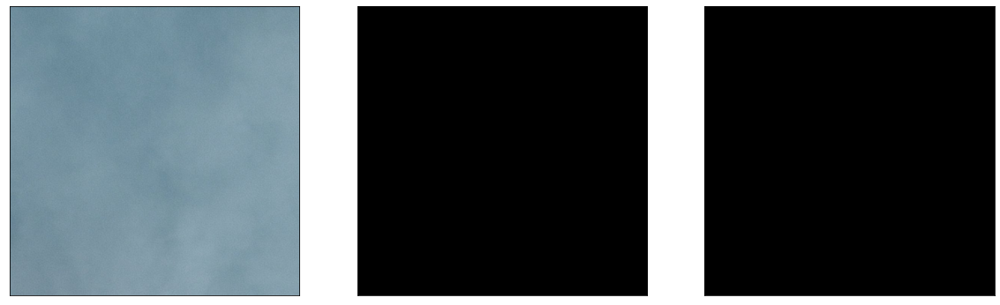

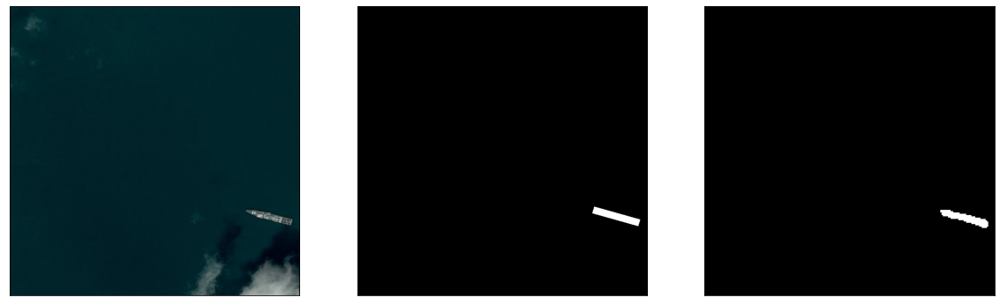

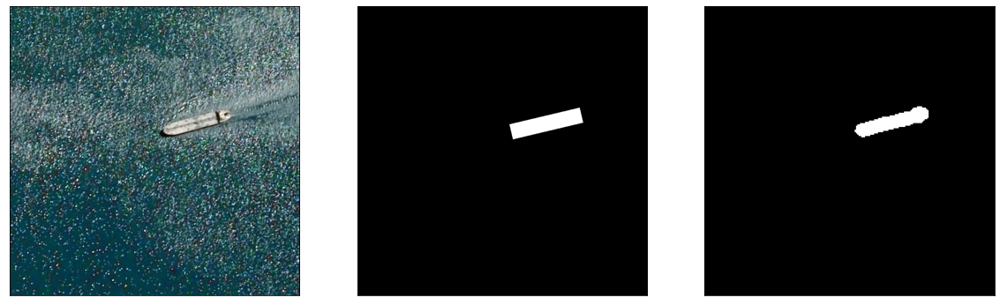

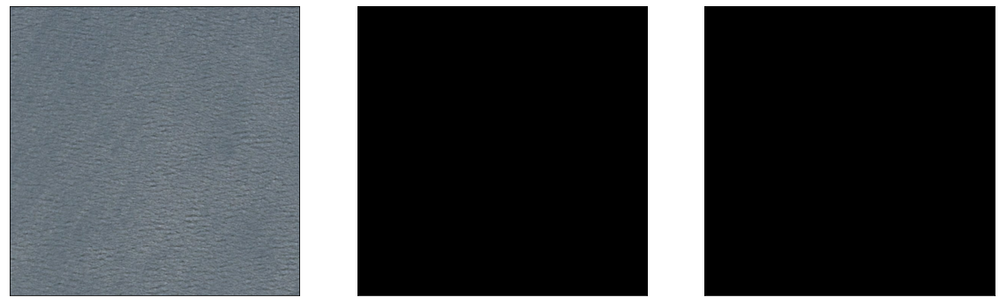

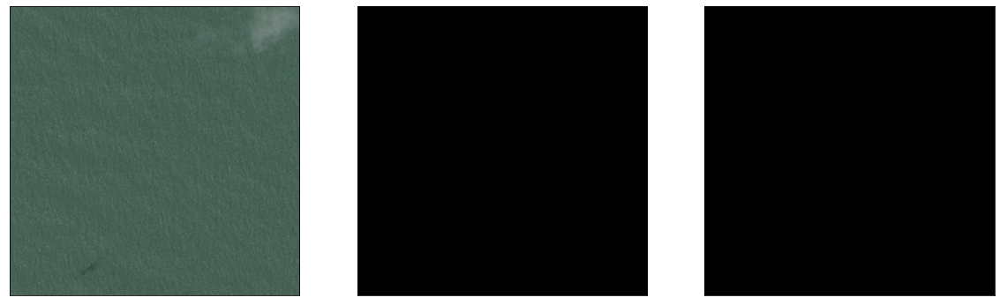

...

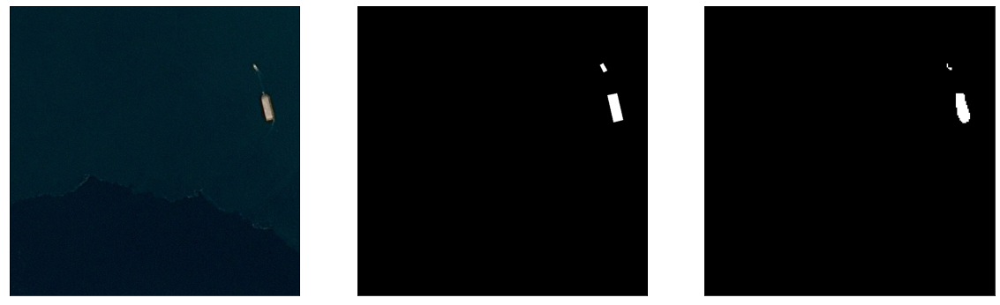

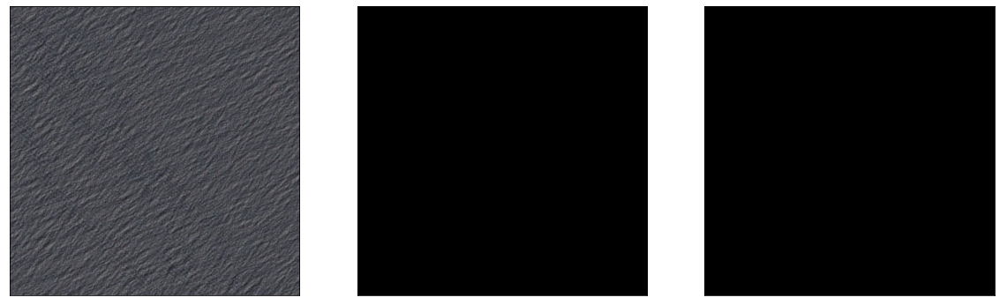

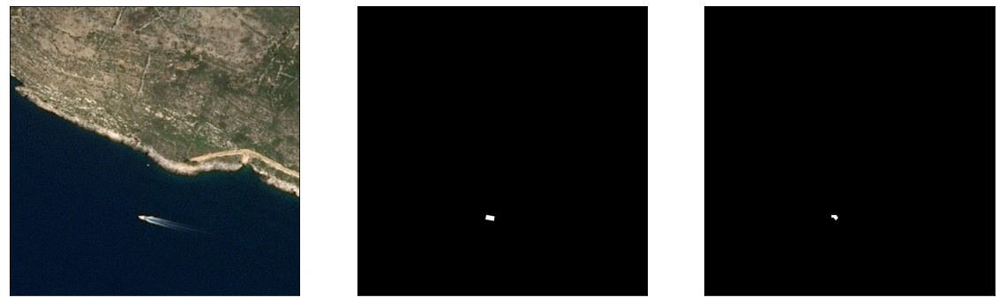

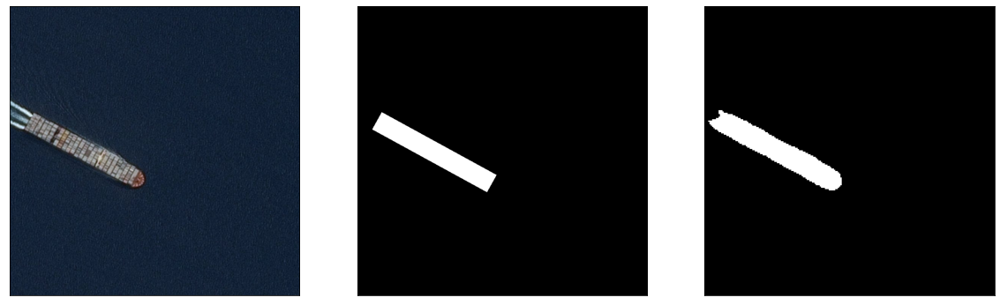

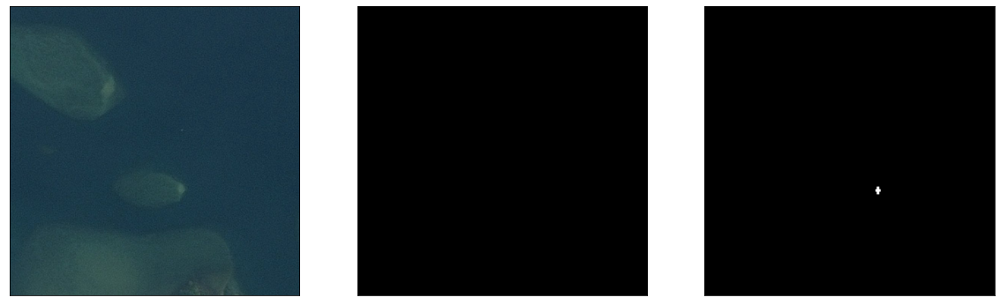

In [18]:
model.freeze()
batch_cnt = 0
test_idx_idx = 0
for batch in test_dataloader:
    img, mask = batch['image'], batch['targets']
    outputs = nn.Sigmoid()(model(img)).cpu().numpy()
    for idx in range(8):
        fig, ax = plt.subplots(1, 3, figsize = (20, 8))
        ax[0].imshow(load_img(TRAIN_IMGS_PATH + train_seg_csv.iloc[test_idx[test_idx_idx]]['ImageId']))
        ax[1].imshow(convert_seg_to_mask(convert_rle_to_seg(train_seg_csv.iloc[test_idx[test_idx_idx]]['EncodedPixels']))[:, :, 0], cmap = 'gray')
        ax[2].imshow(outputs[idx, 0, :, :] >= 0.5, cmap = 'gray')
        for a in ax:
            a.set_xticks([])
            a.set_yticks([])
        plt.show()
        test_idx_idx += 1
    batch_cnt += 1
    if(batch_cnt == 5):
        break